<a href="https://colab.research.google.com/github/Lk0099/OpenCV/blob/main/ComputerVision_OpenCV1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Face Detection 

In [ ]:
import cv2
from google.colab.patches import cv2_imshow 

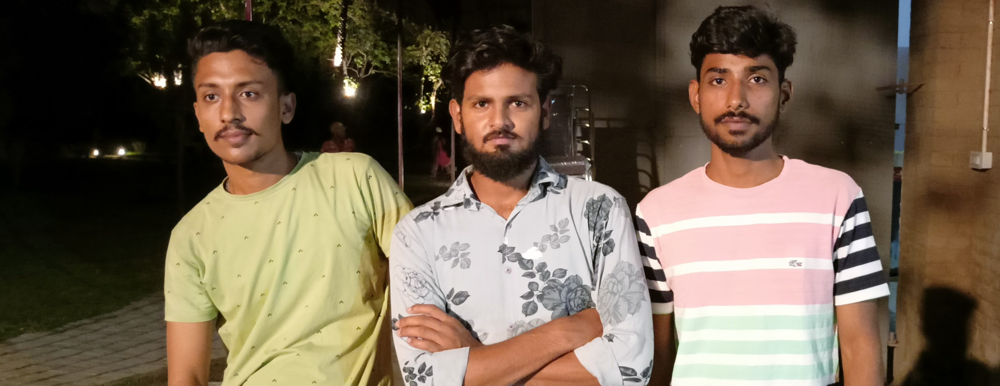

In [ ]:
file1 = '/content/1.jpg'
file2 = '/content/RajuLalitSandeep.jpg'
img1 = cv2.imread(file2 )
cv2_imshow(img1)

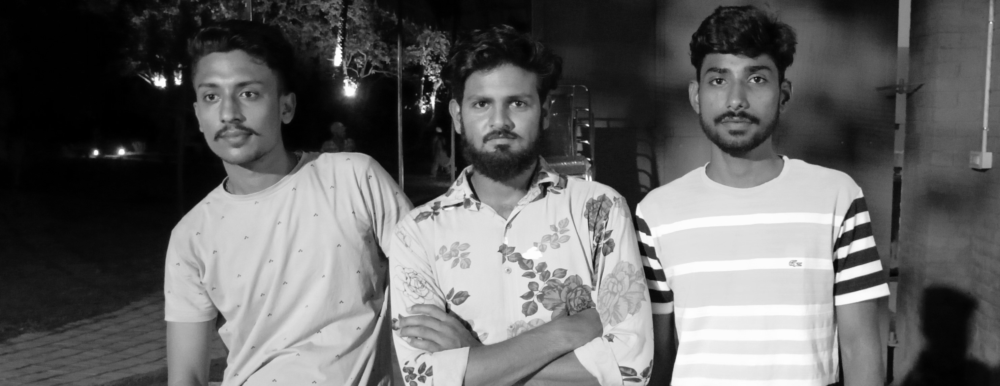

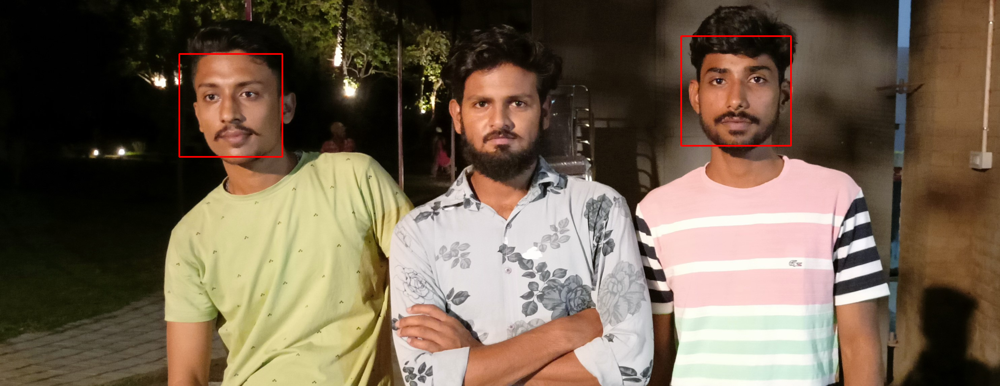

In [ ]:
# create object link to selected classifier 
face_detection = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
# convert the image into gray scale 
kgray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
cv2_imshow(kgray)

# go for face detection
faces = face_detection.detectMultiScale( kgray, 1.3, 5)
#faces # x,y ,w,h
cv2.rectangle( img1 , (faces[0][0] ,faces[0][1] )  , (faces[0][0] +faces[0][2] ,faces[0][1] +faces[0][3] ) , (0,0,255),4 )
cv2.rectangle( img1 , (faces[1][0] ,faces[1][1] )  , (faces[1][0] +faces[1][2] ,faces[1][1] +faces[1][3] ) , (0,0,255),4 )
cv2_imshow(img1)


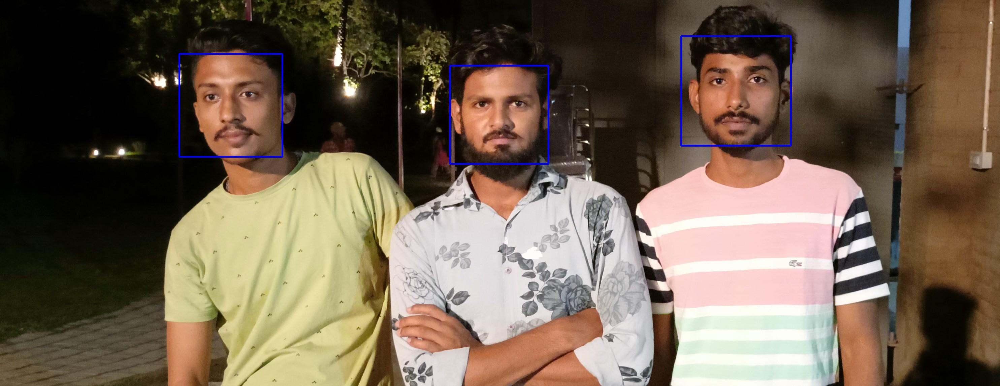

In [ ]:
for (x,y,w,h) in faces :
  img1 = cv2.rectangle (img1, (x,y), (x+w, y+h) , (255,0,0), 3) 
cv2_imshow(img1)


### Face Recoginition 

In [ ]:
import cv2
import numpy as np
from PIL import Image
import os
# create ImageDataset folder with images name as user.1.x, user.2.x and trainer.yml file  
# Path for face image database
path = 'ImageDataset/'
recognizer = cv2.face.LBPHFaceRecognizer_create()
detector = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml");
#  1 - Nelson Madela , 2 - Barack Obama  3- Priyanka Chopra, 5 - Bill Gates 

In [ ]:
def getImagesAndLabels(path):

    imagePaths = [os.path.join(path,f) for f in os.listdir(path)]     
    faceSamples=[]
    ids = []
       
    for imagePath in imagePaths:
      try:
        PIL_img = Image.open(imagePath).convert('L') # convert it to grayscale
        img_numpy = np.array(PIL_img,'uint8')

        id = int(os.path.split(imagePath)[-1].split(".")[1])
        faces = detector.detectMultiScale(img_numpy)

        for (x,y,w,h) in faces:
            faceSamples.append(img_numpy[y:y+h,x:x+w])
            ids.append(id)
      except : 
        pass
 
    return faceSamples,ids

In [ ]:
print ("\n [INFO] Training faces. It will take a few seconds. Wait ...")
faces,ids = getImagesAndLabels(path)


 [INFO] Training faces. It will take a few seconds. Wait ...


FileNotFoundError: ignored

In [ ]:
print ( len(faces) , len(ids ) , np.unique(ids))

In [ ]:
print (ids)

In [ ]:
recognizer.train(faces, np.array(ids))

# Save the model into trainer/trainer.yml
recognizer.write('trainer.yml') 

# Print the numer of faces trained and end program
print("\n [INFO] {0} faces trained. Exiting Program".format(len(np.unique(ids))))
print(np.unique(ids))

#### take input and find the person id 

In [ ]:
import cv2
import os
import numpy as np
from google.colab.patches import cv2_imshow
testfile1 = '/content/sample_data/priyankaTest1.png'
testfile2 = '/content/sample_data/mandelaObamatest1.png'
testfile3 = '/content/sample_data/priyankaObama.png'
img = cv2.imread(testfile2)
cv2_imshow(img)

In [ ]:
# predict the user face in test image 
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#cv2_imshow(gray)
faces = detector.detectMultiScale( gray, scaleFactor = 1.2, minNeighbors = 5  )

In [ ]:
print(faces) 
#show green marker across first face 
x,y,w,h = faces[0]
cv2.rectangle(img, (x,y), (x+w,y+h), (0,255,0), 2)
cv2_imshow(img)

In [ ]:
# for all detected faces 
for x,y,w,h in faces : 
  cv2.rectangle(img, (x,y), (x+w,y+h), (0,255,0), 2)
cv2_imshow(img)

In [ ]:
for x,y,w,h in faces : 
  id, confidence = recognizer.predict(gray[y:y+h,x:x+w])

In [ ]:
print (id, confidence)

In [ ]:
names  = [' ','Nelson Madela' , 'Barack Obama', 'Priyanka Chopra','','Bill Gates']
# 1 - Nelson Madela , 2 - Barack Obama  3- Priyanka Chopra, 5 - Bill Gates 
#print(names[3])
print(names[id] + " "+ str(int(confidence)) +'%')

In [ ]:
# write the name on image
str1 = str(int(confidence)) +'%'+ " "+ names[id]   
font = cv2.FONT_HERSHEY_SIMPLEX
#putText(img, text, org, fontFace, fontScale, color[, thickness[, lineType[, bottomLeftOrigin]]]) 
cv2.putText( img, str( str1 ) ,(x,y) , font , .5, (255,0,0))
cv2_imshow( img )

#### all together 

In [ ]:
testfile1 = '/content/ImageDataset/Obama.2.20.png'
testfile1 = '/content/sample_data/priyankaTest1.png'
testfile2 = '/content/sample_data/mandelaObamatest1.png'
testfile3 = '/content/sample_data/priyankaObama.png'
testfile1 = '/content/sample_data/priyankaTest2.png'
testfile1 = '/content/sample_data/priyanka5.png'
testfile1 = '/content/sample_data/priyanka3images.png'
img = cv2.imread(testfile1)
cv2_imshow(img)
names  = [' ','NelsonMadela' , 'BarackObama', 'PriyankaChopra','','BillGates']
font = cv2.FONT_HERSHEY_SIMPLEX
serverurl = 'http://aimljuly22.glitch.me/storedata?uname='

# predict the user face in test image 
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#cv2_imshow(gray)
faces = detector.detectMultiScale( gray, scaleFactor = 1.2, minNeighbors = 5  )

# for all detected faces 
for x,y,w,h in faces : 
  serverurl = 'http://aimljuly22.glitch.me/storedata?uname='
  cv2.rectangle(img, (x,y), (x+w,y+h), (0,255,0), 2)

  # check the face with trainer.yml file and print the name /id as per result
  id, confidence = recognizer.predict(gray[y:y+h,x:x+w])
  if (confidence < 100):
    str1 = str(int(confidence)) +'%'+ " "+ names[id]
    ###########
    print ('push to cloud ' +  names[id]  +str(int(confidence)))
    serverurl= serverurl + names[id] + '&matching='  + str(int(confidence)) +  '&rtime=29-april-23'
    print(serverurl)
    urllib.request.urlopen(serverurl)
    ##########
  else :
    str1 = "unknown "
  cv2.putText( img, str( str1 ) ,(x,y) , font , .5, (255,0,0))

  st1 = ''
cv2_imshow(img)

In [ ]:
from datetime import datetime  
print(datetime.now())
#dd-mon-yyyy 

#### Push data to Webserver 

In [ ]:
import urllib.request  

In [ ]:
url = 'http://aimljuly22.glitch.me/storedata?uname=Kiran&matching=59&rtime=29-april-23'
urllib.request.urlopen(url)

In [ ]:
print (id, confidence)

#### Webcam 

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
testfile1 = '/content/photo.jpg'

img = cv2.imread(testfile1)
cv2_imshow(img)
names  = [' ','Mandela' , ' ', 'Priyanka Chopra']
font = cv2.FONT_HERSHEY_SIMPLEX

# predict the user face in test image 
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#cv2_imshow(gray)
faces = detector.detectMultiScale( gray, scaleFactor = 1.2, minNeighbors = 5  )

# for all detected faces 
for x,y,w,h in faces : 
  cv2.rectangle(img, (x,y), (x+w,y+h), (0,255,0), 2)

  # check the face with trainer.yml file and print the name /id as per result
  id, confidence = recognizer.predict(gray[y:y+h,x:x+w])
  if (confidence < 100):
    str1 = str(int(confidence)) +'%'+ " "+ names[id]
  else :
    str1 = "unknown "
  cv2.putText( img, str( str1 ) ,(x,y) , font , .5, (255,0,0))

  st1 = ''
cv2_imshow(img)